# Etude sur Développer un modèle prédictif pour limiter le gaspillage des cantines scolaires

Contexte du projet

La cuisine centrale de Nantes Métropole produit par jour entre 15 000 et 16 000 repas qui sont livrés dans 87 établissements. Les familles ont la possibilité d’inscrire ou non les enfants le jour même. Ce système entraine une grande variabilité dans la fréquentation. Celle-ci est effectivement impactée par le contexte sanitaire, la composition des menus, le jour de la semaine, la période de l’année… Cette variabilité contraint la cuisine centrale, très en amont (S-4), à estimer systématiquement le nombre de convives. Ces estimations servent à évaluer les quantités à commander aux fournisseurs. Un constat : le gaspillage alimentaire sur l’ensemble de la métropole est passée de 5% en moyenne entre 2011 et 2016 à 8% sur 2017-2019.

La cuisine centrale souhaite fiabiliser ses commandes. Elle vous demande donc de proposer un modèle prédictif de la fréquentation


## 1 Niveau minimum : l'apprenant a réussi à entrainer un modèle (par exemple une regression linéaire) et à le tester sur un jeu de test. Il a démontré que le modèle fonctionne bien et que ses performances sont acceptables.

## Importation des librairies

Pour l'analyse des donnée, nous aurons besoin de la librairie "pandas" pour lire et manipuler les fichiers; la librairie "numpy" pour tous ceux qui est calcul mathématiques; et la librairie "matplotlib.pyplot" et "seaborn"pour la visualisation de données.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model, model_selection
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
import category_encoders as ce
#from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import GridSearchCV
#from sklearn.preprocessing import StandardScaler, MinMaxScaler
#from sklearn.neighbors import KNeighborsRegressor

## Les options de pandas

Pour les views de pandas, nous avons choisis de ne pas avoir de limite de colonnes et les cellules prennent la place nécessaire pour tout affiché.                               
Selon les besoins, nous modifions le nombre de ligne visible.

In [2]:
pd.set_option("max_colwidth", None)
pd.set_option("max_columns", None)
pd.set_option("max_rows", 50)

## Chargement des fichiers et découverte des données

J'ai un fichier jeux de données fournis ("projet_cantines.csv") que je chargerai en tant que DataFrames grâce à pandas.

In [3]:
data = pd.read_csv("projet_cantines.csv", parse_dates=["date"])

In [4]:
# print(data.info())

J'ai ajouter une column 'freq' pour la frequentation de la cantine

In [5]:
data_cp = data.copy()

In [6]:
data_cp['freq_reel'] = data_cp.reel/data_cp.effectif
data_cp['freq_pre'] = data_cp.prevision/data_cp.effectif

J'ai ajoute des columns 'chocolat' et 'galette_des_rois'

In [7]:
data_cp[data_cp['menu'].str.contains('chocolat')]['reel'].mean()

13416.632653061224

In [8]:
data_cp[data_cp['menu'].str.contains('Galette des rois')]['reel'].mean()

13729.333333333334

In [9]:
def chocolat(x):
    if 'chocolat' in x:
        return 1
    else :
        return 0
    
data_cp['chocolat'] = data_cp['menu'].apply(lambda x : chocolat(x))

In [10]:
def galette(x):
    if 'Galette des rois' in x:
        return 1
    else :
        return 0
    
data_cp['galette_des_rois'] = data_cp['menu'].apply(lambda x : galette(x))

In [11]:
data_cp.galette_des_rois.unique()

array([0, 1], dtype=int64)

In [12]:
data_cp.head(2)

,date,annee_scolaire,jour,semaine,mois,greves,ferie,veille_ferie,retour_ferie,vacances,retour_vacances,veille_vacances,fete_musulmane,ramadan,fete_chretienne,fete_juive,inc_grippe,inc_gastro,inc_varicelle,menu,porc,viande,poisson,bio,noel,frites,an_chinois,gaspillage_volume,gaspillage_pourcentagereel_moyen_annee,reel_std_annee,prevision,reel,effectif,freq_reel,freq_pre,chocolat,galette_des_rois
0,2011-01-03,2010-2011,Lundi,1,Janvier,0,0,0,0,0,1,0,0,0,0,0,10505,6554,551,"['Pamplemousse', 'Hachis Parmentier', 'Salade verte', 'Flan caramel']",0,1,0,0,0,0,0,1160,NaN,3032.860872,12289,11129,17373,0.640592,0.707362,0,0
1,2011-01-04,2010-2011,Mardi,1,Janvier,0,0,0,0,0,0,0,0,0,0,0,10505,6554,551,"['Crêpe au fromage', 'emincé de volaille à la forestière', 'haricots beurre / haricots plats', 'St paulin', 'ananas']",0,1,0,0,0,0,0,750,NaN,3032.860872,12558,11808,17373,0.679675,0.722846,0,0


Je supprime des columns qui ne semblent pas impacter la frequence.

"date", 'semaine', "inc_grippe","inc_gastro","inc_varicelle", "menu",  "gaspillage_volume", 'gaspillage_pourcentagereel_moyen_annee', "reel_std_annee"

ensuite, j'ai filtré 'jour' sans mercredi, 'greves', 'ferie', 'vacances' et 'freq_reel'>0.65 pour eliminer des données aberrante.

In [13]:
data_drop = data_cp.drop(["date", 'semaine', "inc_grippe","inc_gastro","inc_varicelle", "menu",  "gaspillage_volume", 'gaspillage_pourcentagereel_moyen_annee', "reel_std_annee"], axis=1)

In [14]:
data_drop = data_drop[data_drop['jour'] != 'Mercredi']

In [15]:
data_drop = data_drop[data_drop['greves'] != 1]

data_drop = data_drop[data_drop['ferie'] != 1]

data_drop = data_drop[data_drop['vacances'] != 1]

data_drop = data_drop[data_drop['freq_reel'] >0.65]

In [16]:
data_drop.describe()

,greves,ferie,veille_ferie,retour_ferie,vacances,retour_vacances,veille_vacances,fete_musulmane,ramadan,fete_chretienne,fete_juive,porc,viande,poisson,bio,noel,frites,an_chinois,prevision,reel,effectif,freq_reel,freq_pre,chocolat,galette_des_rois
count,977.0,977.0,977.000000,977.000000,977.0,977.00000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.00000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000
mean,0.0,0.0,0.007165,0.019447,0.0,0.03173,0.028659,0.022518,0.055271,0.077789,0.029683,0.136131,0.554759,0.267144,0.395087,0.007165,0.03173,0.003071,14070.985670,13399.247697,18858.437052,0.710089,0.745619,0.084954,0.005118
std,0.0,0.0,0.084385,0.138162,0.0,0.17537,0.166932,0.148437,0.228626,0.267977,0.169797,0.343103,0.497247,0.442695,0.489120,0.084385,0.17537,0.055356,1029.606847,989.631143,998.388873,0.026763,0.025405,0.278956,0.071391
min,0.0,0.0,0.000000,0.000000,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,10625.000000,11302.000000,17373.000000,0.650542,0.611581,0.000000,0.000000
25%,0.0,0.0,0.000000,0.000000,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,13280.000000,12602.000000,17955.000000,0.691907,0.729705,0.000000,0.000000
50%,0.0,0.0,0.000000,0.000000,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,14011.000000,13319.000000,18633.000000,0.706844,0.743211,0.000000,0.000000
75%,0.0,0.0,0.000000,0.000000,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,14897.000000,14106.000000,19639.000000,0.725888,0.758654,0.000000,0.000000
max,0.0,0.0,1.000000,1.000000,0.0,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,17201.000000,16423.000000,20685.000000,0.800550,0.856679,1.000000,1.000000


In [17]:
# ajouter index à dataframe

#data_drop['index'] = data_drop.index

In [18]:
#data_drop.shape

## separation de données

data_drop_train (2010-2016) et data_drop_test (2017,2019,2020)

In [19]:
data_drop_train = data_drop[(data_drop['annee_scolaire'] !='2017-2018')  &(data_drop['annee_scolaire'] !='2018-2019')  & (data_drop['annee_scolaire'] !='2019-2020')]

In [20]:
#data_drop_train = data_drop[(data_drop['annee_scolaire'] !='2017-2018')  & (data_drop['annee_scolaire'] !='2018-2019')  & (data_drop['annee_scolaire'] !='2019-2020')]

In [21]:
# data_drop_val = data_drop[(data_drop['annee_scolaire'] =='2017-2018')]

In [22]:
data_drop_test = data_drop[(data_drop['annee_scolaire'] =='2017-2018') |(data_drop['annee_scolaire'] =='2018-2019') | (data_drop['annee_scolaire'] =='2019-2020')]

get_dummies() converts categorical data into dummy or indicator variables

In [23]:
#data_drop_train_val_dm = pd.get_dummies(data_drop_train_val)

In [24]:
data_drop_train_dm = pd.get_dummies(data_drop_train)

In [25]:
#data_drop_val_dm = pd.get_dummies(data_drop_val)

In [26]:
data_drop_test_dm = pd.get_dummies(data_drop_test)

In [27]:
data_drop_test_dm.head(3)

,greves,ferie,veille_ferie,retour_ferie,vacances,retour_vacances,veille_vacances,fete_musulmane,ramadan,fete_chretienne,fete_juive,porc,viande,poisson,bio,noel,frites,an_chinois,prevision,reel,effectif,freq_reel,freq_pre,chocolat,galette_des_rois,annee_scolaire_2017-2018,annee_scolaire_2018-2019,annee_scolaire_2019-2020,jour_Jeudi,jour_Lundi,jour_Mardi,jour_Vendredi,mois_Avril,mois_Decembre,mois_Fevrier,mois_Janvier,mois_Juillet,mois_Juin,mois_Mai,mois_Mars,mois_Novembre,mois_Octobre,mois_Septembre
878,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,14317,13411,19958,0.671961,0.717356,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
879,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,14555,14101,19958,0.706534,0.729281,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
880,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,15094,14675,19958,0.735294,0.756288,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1


In [28]:
data_drop_train_dm.shape, data_drop_test_dm.shape

((737, 47), (240, 43))

get_dummies() converts categorical data into dummy or indicator variables

In [29]:
data_drop_dm = pd.get_dummies(data_drop)

In [30]:
data_drop_train_dm.tail(1)

,greves,ferie,veille_ferie,retour_ferie,vacances,retour_vacances,veille_vacances,fete_musulmane,ramadan,fete_chretienne,fete_juive,porc,viande,poisson,bio,noel,frites,an_chinois,prevision,reel,effectif,freq_reel,freq_pre,chocolat,galette_des_rois,annee_scolaire_2010-2011,annee_scolaire_2011-2012,annee_scolaire_2012-2013,annee_scolaire_2013-2014,annee_scolaire_2014-2015,annee_scolaire_2015-2016,annee_scolaire_2016-2017,jour_Jeudi,jour_Lundi,jour_Mardi,jour_Vendredi,mois_Avril,mois_Decembre,mois_Fevrier,mois_Janvier,mois_Juillet,mois_Juin,mois_Mai,mois_Mars,mois_Novembre,mois_Octobre,mois_Septembre
876,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,14956,13139,19639,0.669026,0.761546,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0


# echantilloage des données

In [31]:
# X (entrées) est sans 'freq_','effectif' ni 'prevision' de data_drop_dm

X_train = data_drop_train_dm.drop(['freq_reel','freq_pre','prevision'], axis=1)

In [32]:
X_train.shape

(737, 44)

In [33]:
# y (target) est 'reel' de data_drop_dm

y_train = data_drop_train_dm['reel']
y_train.shape

y_train_prevision = data_drop_train_dm['prevision']

In [34]:
# X (entrées) est sans 'freq_','effectif' ni 'prevision' de data_drop_dm

X_test = data_drop_test_dm.drop(['freq_reel','freq_pre','prevision'], axis=1)
X_test.head(3)

,greves,ferie,veille_ferie,retour_ferie,vacances,retour_vacances,veille_vacances,fete_musulmane,ramadan,fete_chretienne,fete_juive,porc,viande,poisson,bio,noel,frites,an_chinois,reel,effectif,chocolat,galette_des_rois,annee_scolaire_2017-2018,annee_scolaire_2018-2019,annee_scolaire_2019-2020,jour_Jeudi,jour_Lundi,jour_Mardi,jour_Vendredi,mois_Avril,mois_Decembre,mois_Fevrier,mois_Janvier,mois_Juillet,mois_Juin,mois_Mai,mois_Mars,mois_Novembre,mois_Octobre,mois_Septembre
878,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,13411,19958,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
879,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,14101,19958,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
880,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,14675,19958,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1


In [35]:
y_test = data_drop_test_dm['reel']
y_test.shape

(240,)

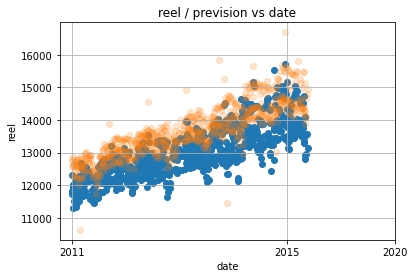

In [36]:
# reel augmente contre l'année
plt.scatter(X_train.index, y_train)
plt.scatter(X_train.index, y_train_prevision, alpha=0.2)
#y.plot()
plt.title('reel / prevision vs date')
plt.xlabel('date')
plt.ylabel('reel')
plt.xticks([0,800,1200],[2011,2015,2020])
#plt.xticks([0,1200],[2011,2020])

# グリッド線を表示するならTrue
plt.grid(True)

## effectuer la régression linéaire entre x et y utilisant la fonction statsmodels.api  線形回帰

J'ai changé les hyperparamètres pour avoir le meilleur score

In [37]:
X_train.columns

Index(['greves', 'ferie', 'veille_ferie', 'retour_ferie', 'vacances',
       'retour_vacances', 'veille_vacances', 'fete_musulmane', 'ramadan',
       'fete_chretienne', 'fete_juive', 'porc', 'viande', 'poisson', 'bio',
       'noel', 'frites', 'an_chinois', 'reel', 'effectif', 'chocolat',
       'galette_des_rois', 'annee_scolaire_2010-2011',
       'annee_scolaire_2011-2012', 'annee_scolaire_2012-2013',
       'annee_scolaire_2013-2014', 'annee_scolaire_2014-2015',
       'annee_scolaire_2015-2016', 'annee_scolaire_2016-2017', 'jour_Jeudi',
       'jour_Lundi', 'jour_Mardi', 'jour_Vendredi', 'mois_Avril',
       'mois_Decembre', 'mois_Fevrier', 'mois_Janvier', 'mois_Juillet',
       'mois_Juin', 'mois_Mai', 'mois_Mars', 'mois_Novembre', 'mois_Octobre',
       'mois_Septembre'],
      dtype='object')

In [38]:
col = [   'porc', 
         'viande', 
       'poisson',
       'noel',  
       'effectif',
        'jour_Lundi',  
       'mois_Fevrier',  'mois_Juin',
         
       'mois_Septembre']

In [39]:
X_train_col = X_train[col]
X_train_col.shape

(737, 9)

In [40]:
X_test.head(3)

,greves,ferie,veille_ferie,retour_ferie,vacances,retour_vacances,veille_vacances,fete_musulmane,ramadan,fete_chretienne,fete_juive,porc,viande,poisson,bio,noel,frites,an_chinois,reel,effectif,chocolat,galette_des_rois,annee_scolaire_2017-2018,annee_scolaire_2018-2019,annee_scolaire_2019-2020,jour_Jeudi,jour_Lundi,jour_Mardi,jour_Vendredi,mois_Avril,mois_Decembre,mois_Fevrier,mois_Janvier,mois_Juillet,mois_Juin,mois_Mai,mois_Mars,mois_Novembre,mois_Octobre,mois_Septembre
878,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,13411,19958,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
879,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,14101,19958,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
880,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,14675,19958,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1


In [41]:
X_test_col = X_test[col]

In [42]:
y_train = data_drop_train_dm['reel']
y_train.shape

(737,)

In [43]:
import statsmodels.api as sm
import numpy as np

# crée un constant
X_train_col = sm.add_constant(X_train_col)

# multiplier tous les features en 'effiectif'
func = lambda x: np.asarray(x) * np.asarray(data_drop_train_dm['effectif'])
X_train_col = X_train_col.apply(func)

# declaration de modéle
model = sm.OLS(y_train, X_train_col, fit_intercept = True)
results = model.fit()
print(results.summary())

# P : P value = indicateur entre 0 et 1. Si P est proche de 0, ce feature(variable) is est plus important. 
# Donc il faut eliminer celui de proche à 1.

                                 OLS Regression Results                                
Dep. Variable:                   reel   R-squared (uncentered):                   0.999
Model:                            OLS   Adj. R-squared (uncentered):              0.999
Method:                 Least Squares   F-statistic:                          1.374e+05
Date:                Tue, 19 Oct 2021   Prob (F-statistic):                        0.00
Time:                        23:45:24   Log-Likelihood:                         -5249.5
No. Observations:                 737   AIC:                                  1.052e+04
Df Residuals:                     727   BIC:                                  1.057e+04
Df Model:                          10                                                  
Covariance Type:            nonrobust                                                  
                     coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------

In [44]:
# t : Plus la valeur absolue de t est grande, plus l'impact sur la variable cible est important.
# |t| >2 : ferie , ramadan, porc, viand, poisson, noel, frites, jour_Vendredi, mois_Fevrier, mois_Juillet, mois_Juin, mois_Septembre

In [45]:
 data_drop_train_dm.head(3)

,greves,ferie,veille_ferie,retour_ferie,vacances,retour_vacances,veille_vacances,fete_musulmane,ramadan,fete_chretienne,fete_juive,porc,viande,poisson,bio,noel,frites,an_chinois,prevision,reel,effectif,freq_reel,freq_pre,chocolat,galette_des_rois,annee_scolaire_2010-2011,annee_scolaire_2011-2012,annee_scolaire_2012-2013,annee_scolaire_2013-2014,annee_scolaire_2014-2015,annee_scolaire_2015-2016,annee_scolaire_2016-2017,jour_Jeudi,jour_Lundi,jour_Mardi,jour_Vendredi,mois_Avril,mois_Decembre,mois_Fevrier,mois_Janvier,mois_Juillet,mois_Juin,mois_Mai,mois_Mars,mois_Novembre,mois_Octobre,mois_Septembre
1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,12558,11808,17373,0.679675,0.722846,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0,12753,11741,17373,0.675819,0.734070,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,12812,12322,17373,0.709261,0.737466,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0


In [46]:
data_drop_train_dm['gaspillage'] = data_drop_train_dm['prevision'] - data_drop_train_dm['reel']

1      12087.0
2      12113.0
3      12515.0
4      12085.0
5      12087.0
        ...   
868    13627.0
869    14015.0
871    13627.0
872    14111.0
876    14617.0
Name: 1.0, Length: 737, dtype: float64
1      12147.0
2      12174.0
3      12578.0
4      12145.0
5      12147.0
        ...   
868    13695.0
869    14085.0
871    13695.0
872    14182.0
876    14690.0
Name: 1.005, Length: 737, dtype: float64
1      12208.0
2      12235.0
3      12640.0
4      12205.0
5      12208.0
        ...   
868    13763.0
869    14155.0
871    13763.0
872    14252.0
876    14763.0
Name: 1.01, Length: 737, dtype: float64
1      12268.0
2      12295.0
3      12703.0
4      12266.0
5      12268.0
        ...   
868    13831.0
869    14225.0
871    13831.0
872    14323.0
876    14837.0
Name: 1.015, Length: 737, dtype: float64
1      12328.0
2      12356.0
3      12765.0
4      12326.0
5      12328.0
        ...   
868    13900.0
869    14295.0
871    13900.0
872    14393.0
876    14910.0
Name: 1.02, Le

C:\Users\nante\anaconda3\envs\simplon\lib\site-packages\pandas\plotting\_matplotlib\core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


1      12752.0
2      12780.0
3      13203.0
4      12749.0
5      12752.0
        ...   
868    14377.0
869    14786.0
871    14377.0
872    14887.0
876    15421.0
Name: 1.055, Length: 737, dtype: float64
1      12812.0
2      12840.0
3      13266.0
4      12810.0
5      12812.0
        ...   
868    14445.0
869    14856.0
871    14445.0
872    14958.0
876    15494.0
Name: 1.06, Length: 737, dtype: float64
1      12872.0
2      12901.0
3      13328.0
4      12870.0
5      12872.0
        ...   
868    14513.0
869    14926.0
871    14513.0
872    15028.0
876    15567.0
Name: 1.065, Length: 737, dtype: float64
1      12933.0
2      12961.0
3      13391.0
4      12931.0
5      12933.0
        ...   
868    14581.0
869    14996.0
871    14581.0
872    15099.0
876    15640.0
Name: 1.07, Length: 737, dtype: float64
1      12993.0
2      13022.0
3      13454.0
4      12991.0
5      12993.0
        ...   
868    14649.0
869    15066.0
871    14649.0
872    15169.0
876    15714.0
Name: 1.075, 

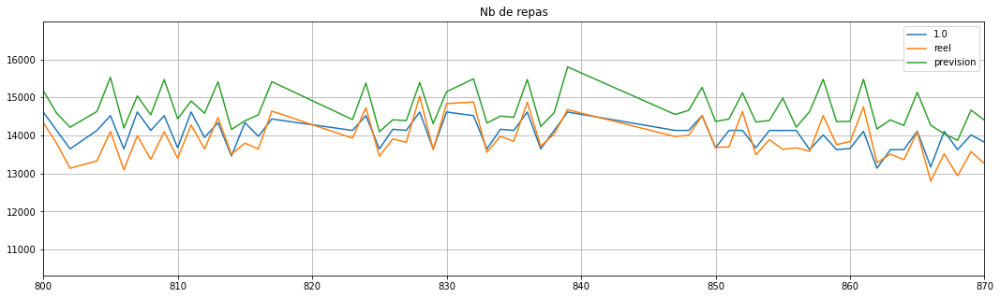

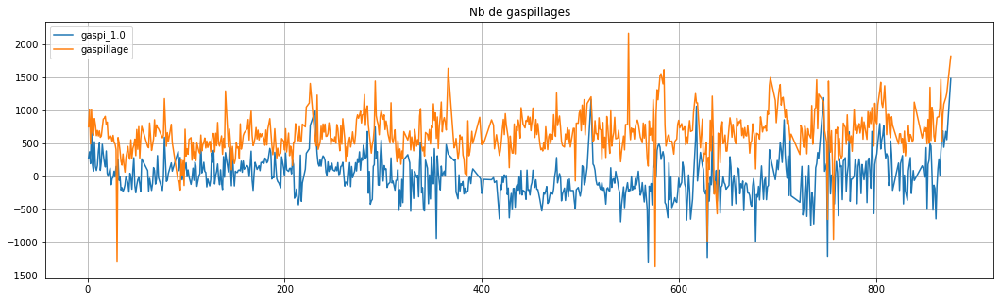

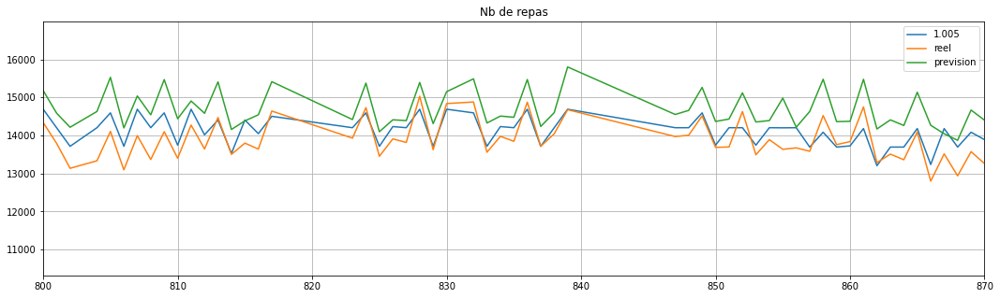

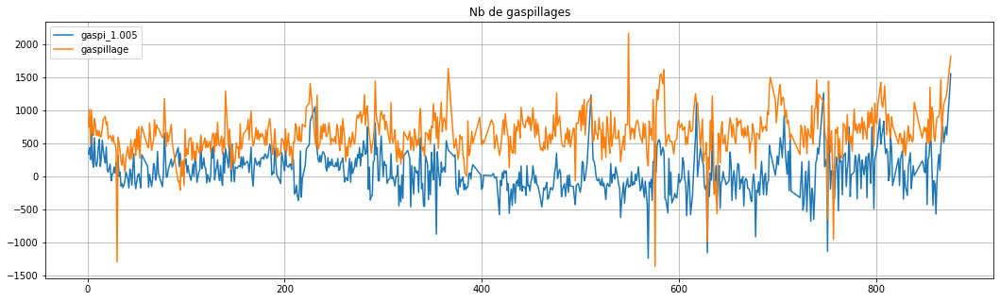

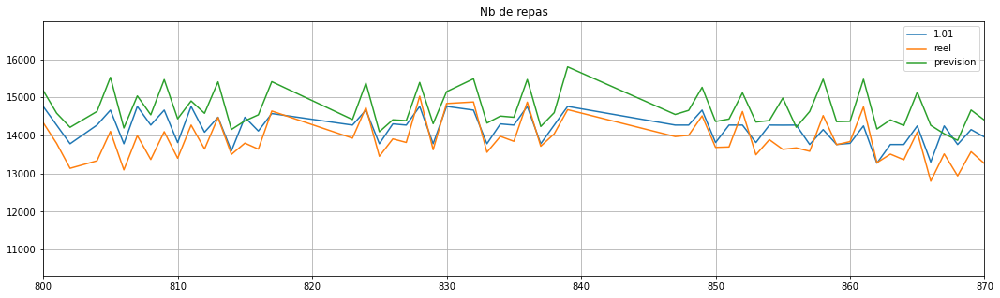

...

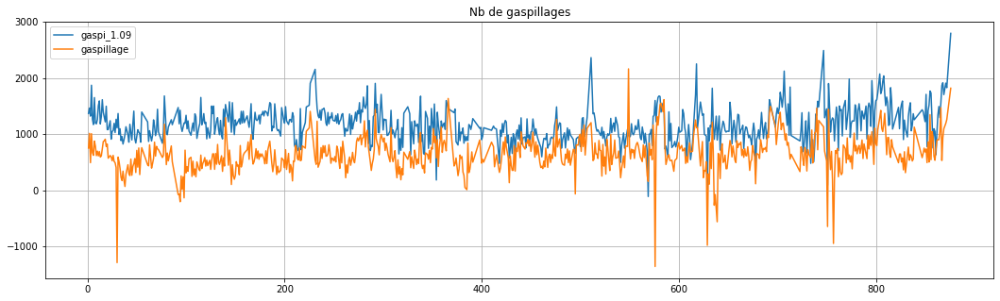

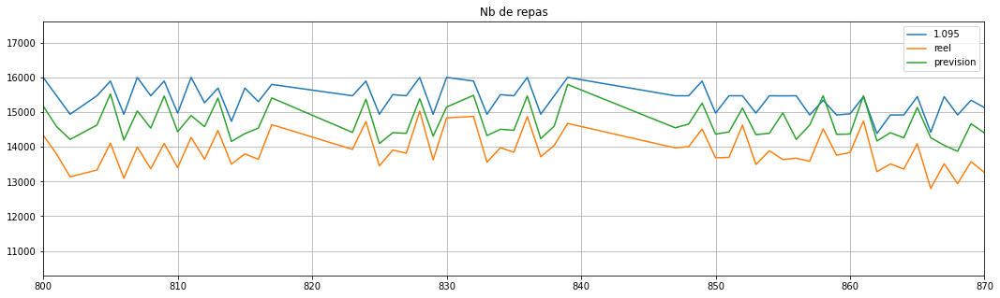

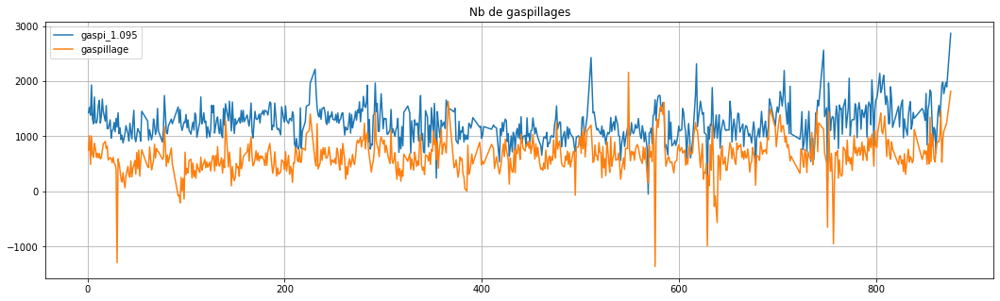

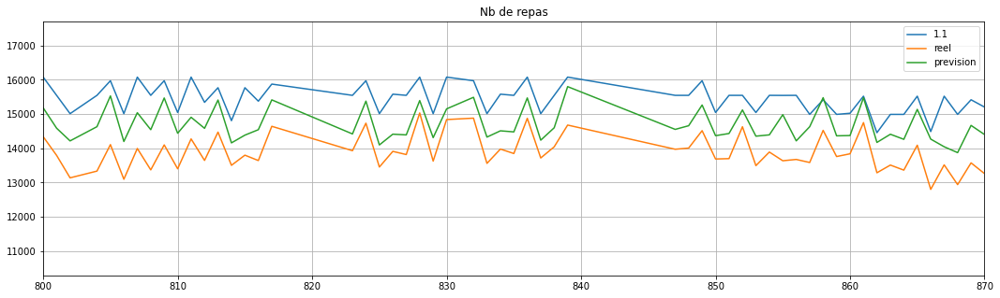

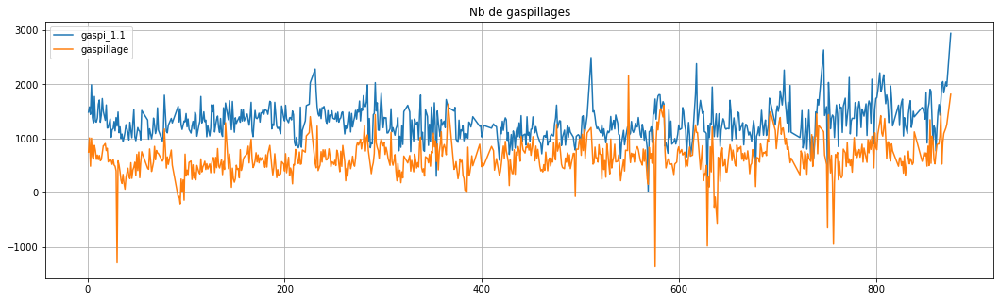

In [47]:
pred_train = results.predict(X_train_col)
for i in np.arange(1, 1.1, 0.005):
    k = round(i, 3)
    data_drop_train_dm[k] = round(pred_train*k)
    print(data_drop_train_dm[k])
    
    #data_drop_train_dm.plot(y=[k, 'reel', 'prevision'], x='index', xlim=[800, 870],figsize=(18,5), title='Nb de repas')
    data_drop_train_dm.plot(y=[k, 'reel', 'prevision'], xlim=[800, 870],figsize=(18,5), title='Nb de repas')
    plt.grid(True)
    data_drop_train_dm[f'gaspi_{k}'] = data_drop_train_dm[k] - data_drop_train_dm['reel']
    
    #data_drop_train_dm.plot(y=[f'gaspi_{k}', 'gaspillage'], x='index', figsize=(18,5), title='Nb de gaspillages')
    data_drop_train_dm.plot(y=[f'gaspi_{k}', 'gaspillage'], figsize=(18,5), title='Nb de gaspillages')
    
    # manque de repas
    data_drop_train_dm[f'repas_manq_{k}'] = data_drop_train_dm[data_drop_train_dm[f'gaspi_{k}'] < 0][f'gaspi_{k}'].sum()
    plt.grid(True)

In [48]:
data_drop_train_dm.sum()

greves                     0.0
ferie                      0.0
veille_ferie               4.0
retour_ferie              16.0
vacances                   0.0
                       ...    
gaspi_1.095           911854.0
repas_manq_1.095      -34639.0
1.1                 10557096.0
gaspi_1.1             959772.0
repas_manq_1.1             0.0
Length: 111, dtype: float64

In [49]:
data_drop_train_dm.filter(regex='^(1|prevision|reel)', axis=1).describe()

,prevision,reel,1.0,1.005,1.01,1.015,1.02,1.025,1.03,1.035,1.04,1.045,1.05,1.055,1.06,1.065,1.07,1.075,1.08,1.085,1.09,1.095,1.1
count,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000,737.000000
mean,13667.089552,13022.149254,13022.204885,13087.385346,13152.423338,13217.624152,13282.681140,13347.789688,13412.967436,13478.067843,13543.109905,13608.244233,13673.423338,13738.465400,13803.588874,13868.678426,13933.834464,13998.932157,14064.017639,14129.175034,14194.264586,14259.400271,14324.417910
std,805.406402,775.929999,713.622552,717.185458,720.682721,724.373675,727.998793,731.497231,735.128534,738.673507,742.176355,745.769438,749.317510,752.845758,756.449511,760.012322,763.580519,767.187623,770.737819,774.336126,777.867428,781.500821,784.994426
min,10625.000000,11302.000000,11492.000000,11550.000000,11607.000000,11665.000000,11722.000000,11779.000000,11837.000000,11894.000000,11952.000000,12009.000000,12067.000000,12124.000000,12182.000000,12239.000000,12297.000000,12354.000000,12412.000000,12469.000000,12526.000000,12584.000000,12641.000000
25%,13067.000000,12467.000000,12515.000000,12578.000000,12640.000000,12703.000000,12765.000000,12828.000000,12890.000000,12953.000000,13016.000000,13078.000000,13141.000000,13203.000000,13266.000000,13328.000000,13391.000000,13454.000000,13516.000000,13579.000000,13641.000000,13704.000000,13767.000000
50%,13597.000000,12910.000000,12860.000000,12924.000000,12988.000000,13053.000000,13117.000000,13181.000000,13245.000000,13310.000000,13374.000000,13438.000000,13503.000000,13567.000000,13631.000000,13695.000000,13760.000000,13824.000000,13888.000000,13953.000000,14017.000000,14081.000000,14146.000000
75%,14237.000000,13510.000000,13580.000000,13647.000000,13715.000000,13783.000000,13851.000000,13919.000000,13987.000000,14055.000000,14123.000000,14191.000000,14258.000000,14326.000000,14394.000000,14462.000000,14530.000000,14598.000000,14666.000000,14734.000000,14802.000000,14870.000000,14937.000000
max,16693.000000,15722.000000,15787.000000,15866.000000,15945.000000,16024.000000,16103.000000,16182.000000,16261.000000,16340.000000,16418.000000,16497.000000,16576.000000,16655.000000,16734.000000,16813.000000,16892.000000,16971.000000,17050.000000,17129.000000,17208.000000,17287.000000,17366.000000


In [50]:
# manque total de repas par "hyperparametre de modèle"

data_drop_train_dm.filter(regex='^(repas_manq_)', axis=1).head(1)


,repas_manq_1.0,repas_manq_1.005,repas_manq_1.01,repas_manq_1.015,repas_manq_1.02,repas_manq_1.025,repas_manq_1.03,repas_manq_1.035,repas_manq_1.04,repas_manq_1.045,repas_manq_1.05,repas_manq_1.055,repas_manq_1.06,repas_manq_1.065,repas_manq_1.07,repas_manq_1.075,repas_manq_1.08,repas_manq_1.085,repas_manq_1.09,repas_manq_1.095,repas_manq_1.1
1,-83774.0,-61368.0,-43040.0,-29148.0,-19625.0,-13183.0,-8647.0,-5978.0,-4233.0,-3182.0,-2424.0,-1935.0,-1599.0,-1262.0,-927.0,-660.0,-451.0,-260.0,-127.0,-47.0,0.0


In [51]:
data_drop_train_dm[data_drop_train_dm['gaspillage'] < 0]['gaspillage'].sum()

-7021

vrai chiffre de repas manquant  sont 7021 repas. 7021 enfants ne pouvaient pas manger de repas à la cantine pour la periode de train.

à partir de "hyperparametre" 1.035, le chiffre de repas manquant devient en bas de 7021.

à partir de "hyperparametre" 1.095, le chiffre de repas manquant est 0.

In [52]:
# afficher nb gaspillage par "hyperparamettre"

#df.filter(like='apple', axis=0)

data_filter = data_drop_train_dm.filter(regex='^(gaspi_|1|prevision|gaspillage)', axis=1)

In [53]:
data_filter.head(3)

,prevision,gaspillage,1.0,gaspi_1.0,1.005,gaspi_1.005,1.01,gaspi_1.01,1.015,gaspi_1.015,1.02,gaspi_1.02,1.025,gaspi_1.025,1.03,gaspi_1.03,1.035,gaspi_1.035,1.04,gaspi_1.04,1.045,gaspi_1.045,1.05,gaspi_1.05,1.055,gaspi_1.055,1.06,gaspi_1.06,1.065,gaspi_1.065,1.07,gaspi_1.07,1.075,gaspi_1.075,1.08,gaspi_1.08,1.085,gaspi_1.085,1.09,gaspi_1.09,1.095,gaspi_1.095,1.1,gaspi_1.1
1,12558,750,12087.0,279.0,12147.0,339.0,12208.0,400.0,12268.0,460.0,12328.0,520.0,12389.0,581.0,12449.0,641.0,12510.0,702.0,12570.0,762.0,12631.0,823.0,12691.0,883.0,12752.0,944.0,12812.0,1004.0,12872.0,1064.0,12933.0,1125.0,12993.0,1185.0,13054.0,1246.0,13114.0,1306.0,13175.0,1367.0,13235.0,1427.0,13295.0,1487.0
2,12753,1012,12113.0,372.0,12174.0,433.0,12235.0,494.0,12295.0,554.0,12356.0,615.0,12416.0,675.0,12477.0,736.0,12537.0,796.0,12598.0,857.0,12659.0,918.0,12719.0,978.0,12780.0,1039.0,12840.0,1099.0,12901.0,1160.0,12961.0,1220.0,13022.0,1281.0,13083.0,1342.0,13143.0,1402.0,13204.0,1463.0,13264.0,1523.0,13325.0,1584.0
3,12812,490,12515.0,193.0,12578.0,256.0,12640.0,318.0,12703.0,381.0,12765.0,443.0,12828.0,506.0,12890.0,568.0,12953.0,631.0,13016.0,694.0,13078.0,756.0,13141.0,819.0,13203.0,881.0,13266.0,944.0,13328.0,1006.0,13391.0,1069.0,13454.0,1132.0,13516.0,1194.0,13579.0,1257.0,13641.0,1319.0,13704.0,1382.0,13767.0,1445.0


## R2

In [54]:
pred_train = results.predict(X_train_col)
r2_score(y_train, pred_train)

0.8502793989840298

In [55]:
results.rsquared

0.9994710257585523

<AxesSubplot:>

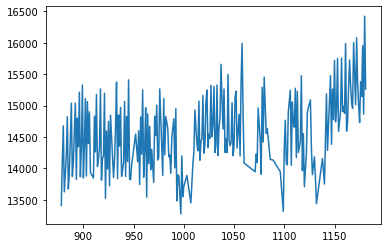

In [56]:
y_test.plot()

## prediction avec ce modèle avec les données de test

In [57]:
# crée un constant pour le test

X_test_col = sm.add_constant(X_test_col)

In [58]:
# multiplier tous les features en 'effiectif'

func = lambda x: np.asarray(x) * np.asarray(data_drop_test_dm['effectif'])
X_test_col = X_test_col.apply(func)

In [59]:
# definir y_test

y_test = data_drop_test_dm['reel']
y_test.shape

(240,)

<AxesSubplot:title={'center':'reel vs date pour test data'}>

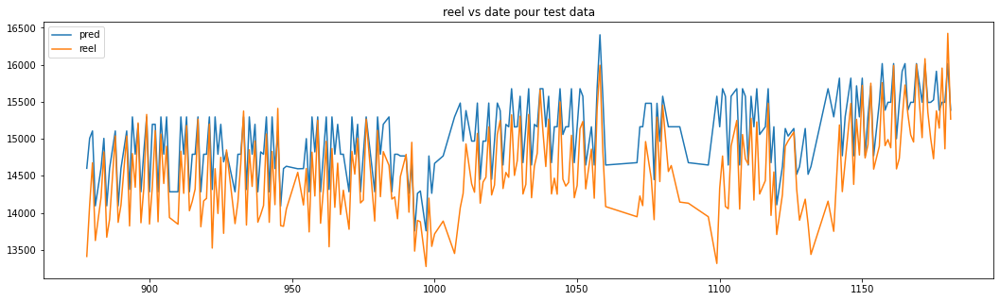

In [60]:
pred = results.predict(X_test_col)
data_drop_test_dm['pred'] = pred*1.025

# data_drop_test_dm.plot(y=['pred', 'reel'], x='index', figsize=(18,5), title='reel vs date pour test data')
data_drop_test_dm.plot(y=['pred', 'reel'], figsize=(18,5), title='reel vs date pour test data')
#plt.xticks([0,800,1000],[2011,2015,2020])

In [61]:
# vérification de la chut de index 1099 : pas de remarque, peut-être veille_vacances
data_drop_test_dm[data_drop_test_dm.index==1099]

,greves,ferie,veille_ferie,retour_ferie,vacances,retour_vacances,veille_vacances,fete_musulmane,ramadan,fete_chretienne,fete_juive,porc,viande,poisson,bio,noel,frites,an_chinois,prevision,reel,effectif,freq_reel,freq_pre,chocolat,galette_des_rois,annee_scolaire_2017-2018,annee_scolaire_2018-2019,annee_scolaire_2019-2020,jour_Jeudi,jour_Lundi,jour_Mardi,jour_Vendredi,mois_Avril,mois_Decembre,mois_Fevrier,mois_Janvier,mois_Juillet,mois_Juin,mois_Mai,mois_Mars,mois_Novembre,mois_Octobre,mois_Septembre,pred
1099,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,15969,13316,20344,0.654542,0.784949,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,15573.854738


## visualisation de gaspillages par param

In [62]:
data_drop_test_dm['gaspillage'] = data_drop_test_dm['prevision'] - data_drop_test_dm['reel']

878     14245.0
879     14639.0
880     14737.0
881     13750.0
883     14245.0
         ...   
1177    15011.0
1178    15114.0
1179    15114.0
1180    15624.0
1181    15011.0
Name: 1.0, Length: 240, dtype: float64
878     14316.0
879     14712.0
880     14811.0
881     13819.0
883     14316.0
         ...   
1177    15086.0
1178    15190.0
1179    15190.0
1180    15702.0
1181    15086.0
Name: 1.005, Length: 240, dtype: float64
878     14387.0
879     14786.0
880     14884.0
881     13888.0
883     14387.0
         ...   
1177    15161.0
1178    15266.0
1179    15266.0
1180    15780.0
1181    15161.0
Name: 1.01, Length: 240, dtype: float64
878     14459.0
879     14859.0
880     14958.0
881     13957.0
883     14459.0
         ...   
1177    15236.0
1178    15341.0
1179    15341.0
1180    15859.0
1181    15236.0
Name: 1.015, Length: 240, dtype: float64
878     14530.0
879     14932.0
880     15032.0
881     14025.0
883     14530.0
         ...   
1177    15311.0
1178    15417.0
1179   

C:\Users\nante\anaconda3\envs\simplon\lib\site-packages\pandas\plotting\_matplotlib\core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


878     15100.0
879     15518.0
880     15621.0
881     14575.0
883     15100.0
         ...   
1177    15911.0
1178    16021.0
1179    16021.0
1180    16562.0
1181    15911.0
Name: 1.06, Length: 240, dtype: float64
878     15171.0
879     15591.0
880     15695.0
881     14644.0
883     15171.0
         ...   
1177    15986.0
1178    16097.0
1179    16097.0
1180    16640.0
1181    15986.0
Name: 1.065, Length: 240, dtype: float64
878     15242.0
879     15664.0
880     15768.0
881     14713.0
883     15242.0
         ...   
1177    16061.0
1178    16172.0
1179    16172.0
1180    16718.0
1181    16061.0
Name: 1.07, Length: 240, dtype: float64
878     15313.0
879     15737.0
880     15842.0
881     14782.0
883     15313.0
         ...   
1177    16137.0
1178    16248.0
1179    16248.0
1180    16796.0
1181    16137.0
Name: 1.075, Length: 240, dtype: float64
878     15384.0
879     15810.0
880     15916.0
881     14850.0
883     15384.0
         ...   
1177    16212.0
1178    16324.0
1179  

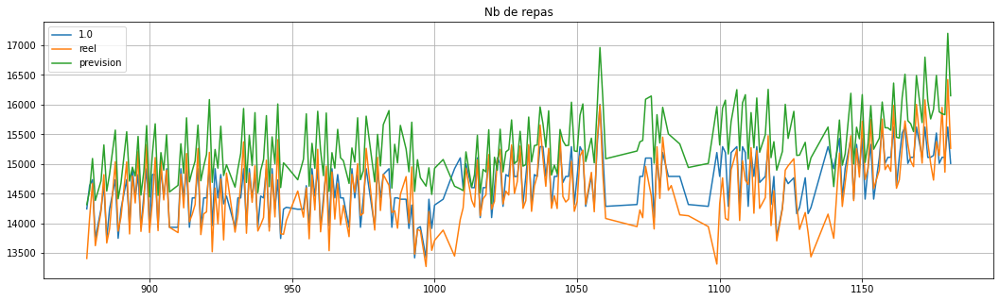

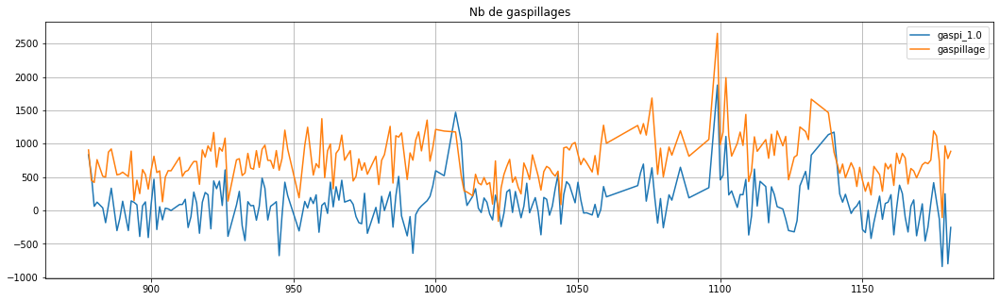

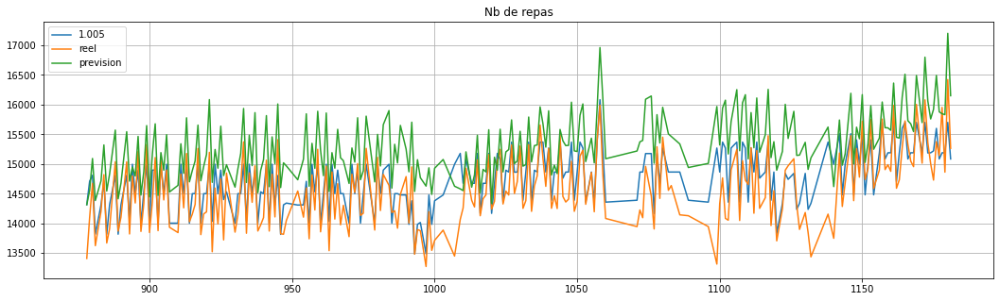

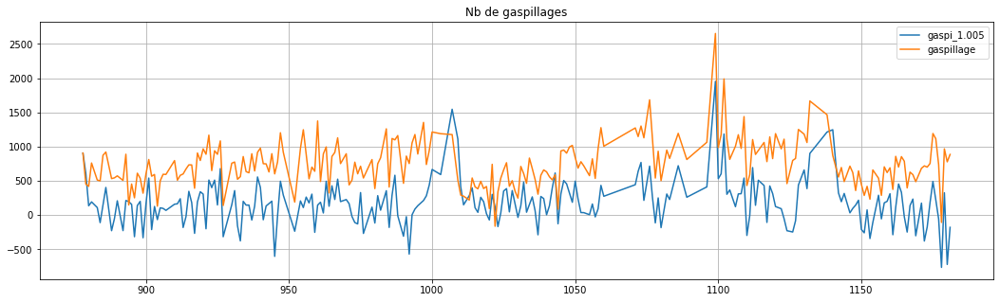

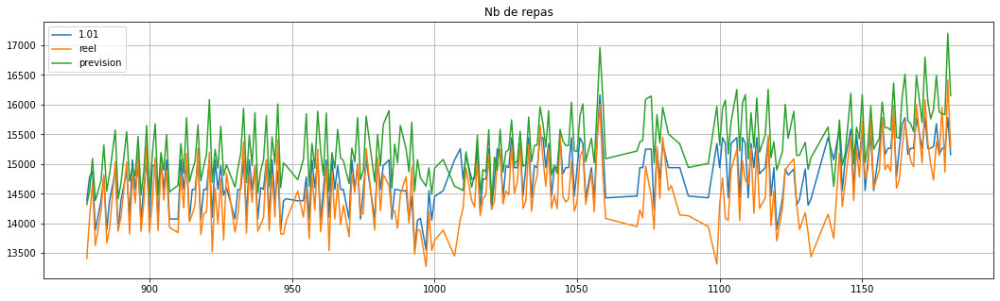

...

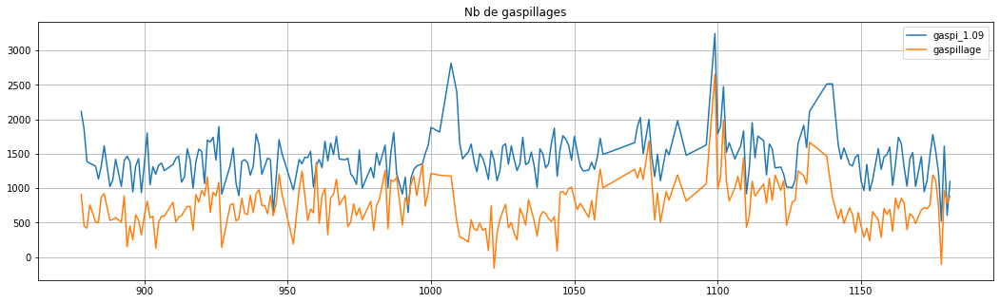

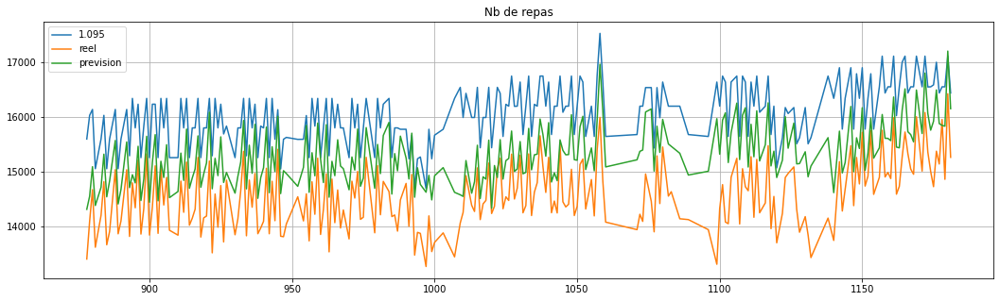

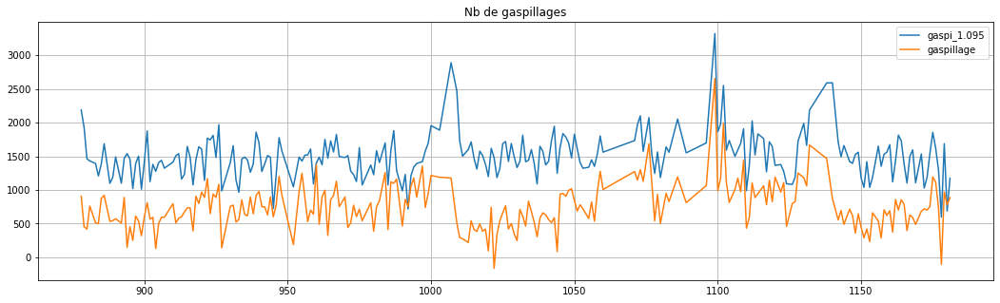

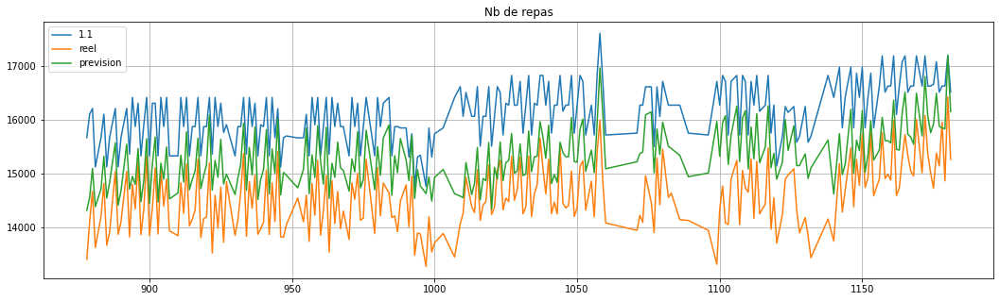

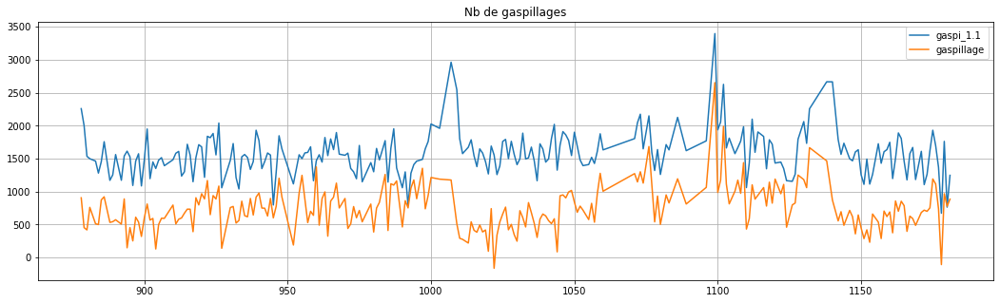

In [63]:
pred_test = results.predict(X_test_col)
for i in np.arange(1, 1.1, 0.005):
    k = round(i, 3)
    data_drop_test_dm[k] = round(pred_test*k)
    print(data_drop_test_dm[k])
    
    #data_drop_test_dm.plot(y=[k, 'reel', 'prevision'], x='index', figsize=(18,5), title='Nb de repas')
    data_drop_test_dm.plot(y=[k, 'reel', 'prevision'], figsize=(18,5), title='Nb de repas')
    plt.grid(True)
    data_drop_test_dm[f'gaspi_{k}'] = data_drop_test_dm[k] - data_drop_test_dm['reel']
    
    # data_drop_test_dm.plot(y=[f'gaspi_{k}', 'gaspillage'], x='index', figsize=(18,5), title='Nb de gaspillages')
    data_drop_test_dm.plot(y=[f'gaspi_{k}', 'gaspillage'],  figsize=(18,5), title='Nb de gaspillages')
    
    data_drop_test_dm[f'repas_manq_{k}'] = data_drop_test_dm[data_drop_test_dm[f'gaspi_{k}'] < 0][f'gaspi_{k}']
    # manque de repas
    #data_drop_test_dm[f'repas_manq_{k}'] = data_drop_test_dm[data_drop_test_dm[f'gaspi_{k}'] < 0][f'gaspi_{k}'].sum()
    plt.grid(True)

In [64]:
# creation d'une column pour repas manque reel

data_drop_test_dm['repas_manq_reel'] = data_drop_test_dm[data_drop_test_dm['gaspillage'] < 0]['gaspillage']
data_drop_test_dm.head(3)

,greves,ferie,veille_ferie,retour_ferie,vacances,retour_vacances,veille_vacances,fete_musulmane,ramadan,fete_chretienne,fete_juive,porc,viande,poisson,bio,noel,frites,an_chinois,prevision,reel,effectif,freq_reel,freq_pre,chocolat,galette_des_rois,annee_scolaire_2017-2018,annee_scolaire_2018-2019,annee_scolaire_2019-2020,jour_Jeudi,jour_Lundi,jour_Mardi,jour_Vendredi,mois_Avril,mois_Decembre,mois_Fevrier,mois_Janvier,mois_Juillet,mois_Juin,mois_Mai,mois_Mars,mois_Novembre,mois_Octobre,mois_Septembre,pred,gaspillage,1.0,gaspi_1.0,repas_manq_1.0,1.005,gaspi_1.005,repas_manq_1.005,1.01,gaspi_1.01,repas_manq_1.01,1.015,gaspi_1.015,repas_manq_1.015,1.02,gaspi_1.02,repas_manq_1.02,1.025,gaspi_1.025,repas_manq_1.025,1.03,gaspi_1.03,repas_manq_1.03,1.035,gaspi_1.035,repas_manq_1.035,1.04,gaspi_1.04,repas_manq_1.04,1.045,gaspi_1.045,repas_manq_1.045,1.05,gaspi_1.05,repas_manq_1.05,1.055,gaspi_1.055,repas_manq_1.055,1.06,gaspi_1.06,repas_manq_1.06,1.065,gaspi_1.065,repas_manq_1.065,1.07,gaspi_1.07,repas_manq_1.07,1.075,gaspi_1.075,repas_manq_1.075,1.08,gaspi_1.08,repas_manq_1.08,1.085,gaspi_1.085,repas_manq_1.085,1.09,gaspi_1.09,repas_manq_1.09,1.095,gaspi_1.095,repas_manq_1.095,1.1,gaspi_1.1,repas_manq_1.1,repas_manq_reel
878,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,14317,13411,19958,0.671961,0.717356,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,14600.964938,906,14245.0,834.0,NaN,14316.0,905.0,NaN,14387.0,976.0,NaN,14459.0,1048.0,NaN,14530.0,1119.0,NaN,14601.0,1190.0,NaN,14672.0,1261.0,NaN,14743.0,1332.0,NaN,14815.0,1404.0,NaN,14886.0,1475.0,NaN,14957.0,1546.0,NaN,15028.0,1617.0,NaN,15100.0,1689.0,NaN,15171.0,1760.0,NaN,15242.0,1831.0,NaN,15313.0,1902.0,NaN,15384.0,1973.0,NaN,15456.0,2045.0,NaN,15527.0,2116.0,NaN,15598.0,2187.0,NaN,15669.0,2258.0,NaN,NaN
879,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,14555,14101,19958,0.706534,0.729281,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,15005.256296,454,14639.0,538.0,NaN,14712.0,611.0,NaN,14786.0,685.0,NaN,14859.0,758.0,NaN,14932.0,831.0,NaN,15005.0,904.0,NaN,15078.0,977.0,NaN,15152.0,1051.0,NaN,15225.0,1124.0,NaN,15298.0,1197.0,NaN,15371.0,1270.0,NaN,15444.0,1343.0,NaN,15518.0,1417.0,NaN,15591.0,1490.0,NaN,15664.0,1563.0,NaN,15737.0,1636.0,NaN,15810.0,1709.0,NaN,15884.0,1783.0,NaN,15957.0,1856.0,NaN,16030.0,1929.0,NaN,16103.0,2002.0,NaN,NaN
880,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,15094,14675,19958,0.735294,0.756288,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,15105.236692,419,14737.0,62.0,NaN,14811.0,136.0,NaN,14884.0,209.0,NaN,14958.0,283.0,NaN,15032.0,357.0,NaN,15105.0,430.0,NaN,15179.0,504.0,NaN,15253.0,578.0,NaN,15326.0,651.0,NaN,15400.0,725.0,NaN,15474.0,799.0,NaN,15547.0,872.0,NaN,15621.0,946.0,NaN,15695.0,1020.0,NaN,15768.0,1093.0,NaN,15842.0,1167.0,NaN,15916.0,1241.0,NaN,15989.0,1314.0,NaN,16063.0,1388.0,NaN,16137.0,1462.0,NaN,16210.0,1535.0,NaN,NaN


In [65]:
data_drop_test_dm.filter(regex='^(1|prevision|reel)', axis=1).describe()

,prevision,reel,1.0,1.005,1.01,1.015,1.02,1.025,1.03,1.035,1.04,1.045,1.05,1.055,1.06,1.065,1.07,1.075,1.08,1.085,1.09,1.095,1.1
count,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.00000,240.000000,240.000000,240.000000,240.000000
mean,15311.283333,14557.254167,14671.858333,14745.300000,14818.625000,14892.070833,14965.429167,15038.762500,15112.187500,15185.441667,15258.791667,15332.212500,15405.495833,15479.083333,15552.225000,15625.654167,15698.887500,15772.329167,15845.70000,15918.891667,15992.458333,16065.670833,16139.104167
std,532.580647,600.225214,476.695227,479.147868,481.465729,483.866340,486.219344,488.652102,490.951039,493.427264,495.818859,498.133269,500.594408,503.020011,505.275449,507.793513,510.047819,512.398229,514.92502,517.199569,519.539745,521.970827,524.417702
min,14317.000000,13275.000000,13421.000000,13488.000000,13555.000000,13622.000000,13690.000000,13757.000000,13824.000000,13891.000000,13958.000000,14025.000000,14092.000000,14159.000000,14226.000000,14294.000000,14361.000000,14428.000000,14495.00000,14562.000000,14629.000000,14696.000000,14763.000000
25%,14925.750000,14106.750000,14319.000000,14391.000000,14462.000000,14534.000000,14606.000000,14677.000000,14749.000000,14820.000000,14892.000000,14964.000000,15035.000000,15107.000000,15178.000000,15250.000000,15322.000000,15393.000000,15465.00000,15536.000000,15608.000000,15680.000000,15751.000000
50%,15239.000000,14479.500000,14779.000000,14853.000000,14927.000000,15001.000000,15075.000000,15148.500000,15222.500000,15296.500000,15370.500000,15444.500000,15518.500000,15592.000000,15666.000000,15740.000000,15814.000000,15888.000000,15962.00000,16036.000000,16109.000000,16183.000000,16257.000000
75%,15684.750000,15006.250000,15011.000000,15086.000000,15161.000000,15236.000000,15311.000000,15386.000000,15461.000000,15536.000000,15611.000000,15686.000000,15761.000000,15836.000000,15911.000000,15986.000000,16061.000000,16137.000000,16212.00000,16287.000000,16362.000000,16437.000000,16512.000000
max,17201.000000,16423.000000,16004.000000,16084.000000,16164.000000,16244.000000,16324.000000,16404.000000,16484.000000,16564.000000,16644.000000,16724.000000,16804.000000,16884.000000,16964.000000,17044.000000,17124.000000,17204.000000,17284.00000,17364.000000,17444.000000,17524.000000,17604.000000


In [66]:
# manque total de repas par "hyperparametre de modèle" pour la periode de test (2018-2020)

data_drop_test_dm.filter(regex='^(repas_manq_)', axis=1).head(1)

,repas_manq_1.0,repas_manq_1.005,repas_manq_1.01,repas_manq_1.015,repas_manq_1.02,repas_manq_1.025,repas_manq_1.03,repas_manq_1.035,repas_manq_1.04,repas_manq_1.045,repas_manq_1.05,repas_manq_1.055,repas_manq_1.06,repas_manq_1.065,repas_manq_1.07,repas_manq_1.075,repas_manq_1.08,repas_manq_1.085,repas_manq_1.09,repas_manq_1.095,repas_manq_1.1,repas_manq_reel
878,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [67]:
# affichage un dataframe pour prevision et gaspi

data_filter_test = data_drop_test_dm.filter(regex='^(gaspi_|1|prevision|gaspillage)', axis=1)

In [68]:
data_filter_test.tail(3)

,prevision,gaspillage,1.0,gaspi_1.0,1.005,gaspi_1.005,1.01,gaspi_1.01,1.015,gaspi_1.015,1.02,gaspi_1.02,1.025,gaspi_1.025,1.03,gaspi_1.03,1.035,gaspi_1.035,1.04,gaspi_1.04,1.045,gaspi_1.045,1.05,gaspi_1.05,1.055,gaspi_1.055,1.06,gaspi_1.06,1.065,gaspi_1.065,1.07,gaspi_1.07,1.075,gaspi_1.075,1.08,gaspi_1.08,1.085,gaspi_1.085,1.09,gaspi_1.09,1.095,gaspi_1.095,1.1,gaspi_1.1
1179,15832,968,15114.0,250.0,15190.0,326.0,15266.0,402.0,15341.0,477.0,15417.0,553.0,15492.0,628.0,15568.0,704.0,15643.0,779.0,15719.0,855.0,15795.0,931.0,15870.0,1006.0,15946.0,1082.0,16021.0,1157.0,16097.0,1233.0,16172.0,1308.0,16248.0,1384.0,16324.0,1460.0,16399.0,1535.0,16475.0,1611.0,16550.0,1686.0,16626.0,1762.0
1180,17201,778,15624.0,-799.0,15702.0,-721.0,15780.0,-643.0,15859.0,-564.0,15937.0,-486.0,16015.0,-408.0,16093.0,-330.0,16171.0,-252.0,16249.0,-174.0,16327.0,-96.0,16405.0,-18.0,16484.0,61.0,16562.0,139.0,16640.0,217.0,16718.0,295.0,16796.0,373.0,16874.0,451.0,16952.0,529.0,17030.0,607.0,17109.0,686.0,17187.0,764.0
1181,16151,886,15011.0,-254.0,15086.0,-179.0,15161.0,-104.0,15236.0,-29.0,15311.0,46.0,15386.0,121.0,15461.0,196.0,15536.0,271.0,15611.0,346.0,15686.0,421.0,15761.0,496.0,15836.0,571.0,15911.0,646.0,15986.0,721.0,16061.0,796.0,16137.0,872.0,16212.0,947.0,16287.0,1022.0,16362.0,1097.0,16437.0,1172.0,16512.0,1247.0


In [69]:
data_drop_test_dm.filter(regex='^(gaspi_|gaspillage)', axis=1).head(3)

,gaspillage,gaspi_1.0,gaspi_1.005,gaspi_1.01,gaspi_1.015,gaspi_1.02,gaspi_1.025,gaspi_1.03,gaspi_1.035,gaspi_1.04,gaspi_1.045,gaspi_1.05,gaspi_1.055,gaspi_1.06,gaspi_1.065,gaspi_1.07,gaspi_1.075,gaspi_1.08,gaspi_1.085,gaspi_1.09,gaspi_1.095,gaspi_1.1
878,906,834.0,905.0,976.0,1048.0,1119.0,1190.0,1261.0,1332.0,1404.0,1475.0,1546.0,1617.0,1689.0,1760.0,1831.0,1902.0,1973.0,2045.0,2116.0,2187.0,2258.0
879,454,538.0,611.0,685.0,758.0,831.0,904.0,977.0,1051.0,1124.0,1197.0,1270.0,1343.0,1417.0,1490.0,1563.0,1636.0,1709.0,1783.0,1856.0,1929.0,2002.0
880,419,62.0,136.0,209.0,283.0,357.0,430.0,504.0,578.0,651.0,725.0,799.0,872.0,946.0,1020.0,1093.0,1167.0,1241.0,1314.0,1388.0,1462.0,1535.0


## creation de DataFrame pour 'param', 'reduction_gaspillage_%', 'nb_jours_repas_manquant', 'nb_repas_manquant'

In [70]:
# creation d'un dataframe pour summary

list_0 = []
list_1 = []
list_2 = []
list_3 = []
#print('reduction gaspillage ')
for g in np.arange(1, 1.1, 0.005):
    gas = round(g, 3)
    list_0.append(gas)
    #print(gas)
    
    # reduction gaspillage %
    data_drop_test_dm[f'red_gaspi_{gas}'] = (data_drop_test_dm['gaspillage'] - data_drop_test_dm[f'gaspi_{gas}'])/data_drop_test_dm['gaspillage'] * 100
    red_gaspi = round(data_drop_test_dm[f'red_gaspi_{gas}'].mean(), 2)
    list_1.append(red_gaspi)
    #print(f'{gas}  ', red_gaspi, '%')
    
    # nb de jour de sous-production
    repas_manq = round(data_drop_test_dm[f'repas_manq_{gas}'].count(), 2)
    list_2.append(repas_manq)
    
    # nb de repas manquantes 
    nb_repas_manq = data_drop_test_dm[f'repas_manq_{gas}'].sum()
    list_3.append(nb_repas_manq)

    
df = pd.DataFrame(list(zip(list_0, list_1, list_2, list_3)), columns = ['param', 'reduction_gaspillage_%', 'nb_jours_repas_manquant', 'nb_repas_manquant'])


In [71]:
# ajouter une ligne pour des données réelles
jour_gas_reel = data_drop_test_dm['repas_manq_reel'].count()

# ajouter une ligne vrai nb de repas manquantes pour la periode de test (2017-2020)
nb_repas_manq = data_drop_test_dm['repas_manq_reel'].sum()

#df.loc[12] = ['reel', 0, jour_gas_reel, nb_repas_manq]

In [72]:
new_row = {'param':'reel', 'reduction_gaspillage_%':0, 'nb_jours_repas_manquant':jour_gas_reel, 'nb_repas_manquant':nb_repas_manq}
#append row to the dataframe
df = df.append(new_row, ignore_index=True)

In [73]:
df.sort_values('nb_repas_manquant')

,param,reduction_gaspillage_%,nb_jours_repas_manquant,nb_repas_manquant
0,1.0,91.88,76,-17273.0
1,1.005,80.02,61,-12178.0
2,1.01,68.20,45,-8244.0
3,1.015,56.34,35,-5291.0
4,1.02,44.52,25,-3076.0
5,1.025,32.67,12,-1753.0
6,1.03,20.83,5,-1168.0
7,1.035,9.00,4,-865.0
8,1.04,-2.83,4,-566.0
21,reel,0.00,2,-270.0


In [74]:
# R2 calcule manuel
se = np.sum(np.square(y_test - pred_test))
st = np.sum(np.square(y_test - np.mean(y_test)))
r2_test = 1-se/st
r2_test

0.6467893133628697

In [75]:
# R2 avec sklearn

pred_test = results.predict(X_test_col)
data_drop_test_dm['pred'] = pred_test
r2_score(y_test, pred_test)

0.6467893133628697

In [76]:
# MAE (Mean Absolute Error) 
# MAE が小さいほど誤差が少なく、予測モデルが正確に予測できていることを示し、
# MAE が大きいほど実際の値と予測値に誤差が大きく、予測モデルが正確に予測できていないといえます

from sklearn.metrics import mean_absolute_error

mean_absolute_error(y_test, pred_test)

258.56225115670946

## visualisation

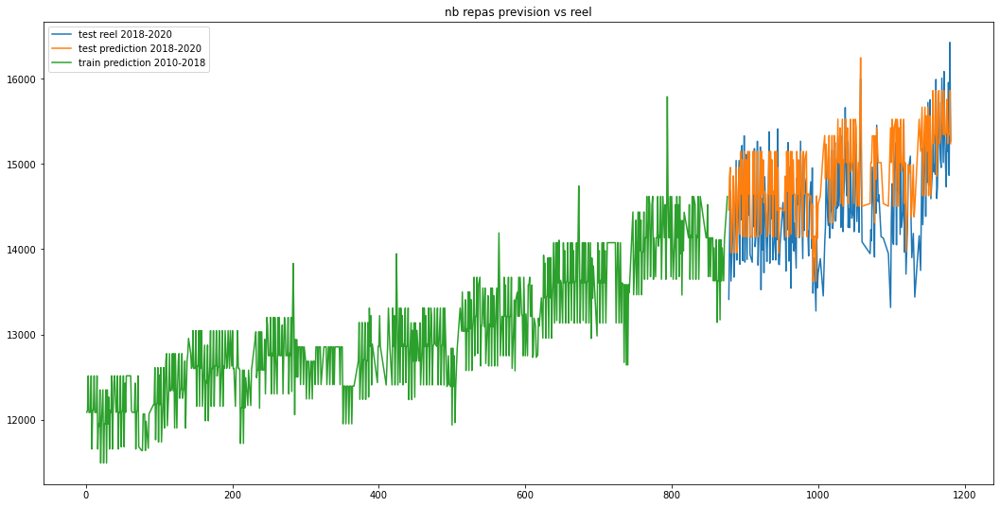

In [77]:
plt.figure(figsize=(18,9))

y_pred_test = results.predict(X_test_col)

plt.title("nb repas prevision vs reel")
plt.plot(X_test_col.index, y_test, label="test reel 2018-2020")
plt.plot(X_test_col.index, y_pred_test*1.015, label="test prediction 2018-2020")
plt.plot(X_train_col.index, pred_train, label="train prediction 2010-2018")
plt.legend()

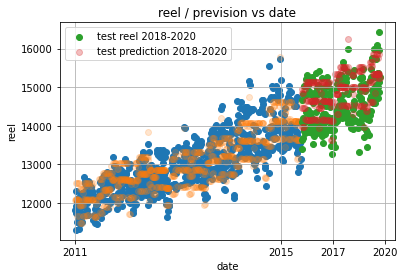

In [78]:
# reel augmente contre l'année
plt.scatter(X_train.index, y_train)
plt.scatter(X_train.index, pred_train, alpha=0.2)
plt.scatter(X_test_col.index, y_test, label="test reel 2018-2020")
plt.scatter(X_test_col.index, y_pred_test*1.015, label="test prediction 2018-2020", alpha=0.3)

#y.plot()
plt.title('reel / prevision vs date')
plt.xlabel('date')
plt.ylabel('reel')
plt.xticks([0,800,1000,1200],[2011,2015,2017,2020])
#plt.xticks([0,1200],[2011,2020])


# グリッド線を表示するならTrue
plt.grid(True)
plt.legend()

## conclusion pour la statsmodel

Les features: 'porc', 'viande','poisson', 'noel', 'effectif', 'jour_Lundi', 'mois_Fevrier',  'mois_Juin', 'mois_Septembre' impactent des frequentations des enfants, donc ces features donnent impact sur les gaspillages.
       
          
Dans les données de test, il y a 2 jours de sous-production dont 270 rêpas manquants.

Avec mon modéle avec param = 1.045, il y a 3 jours de sous-production dont 269 rêpas manquants et gaspillages 14.68% plus que reel.

Avec mon modéle avec param = 1.035, il est possible d'avoir 9 % réduction de gaspillages, mais il y a 4 jours de sous-production dont 865 rêpas manquants.
   
Pour avoir 0 rêpas manquants avec mon modéle, param = 1.06 et le gaspillages augmente 50.18 % que reel.
 

J'ai examiné des jours que mon modéle ne predite pas bien, je constate qu'il y a 'greves', 'inc_grippe','inc_gastro', 'inc_varicelle', 'ramadan', 'retour_vacances', etc. par contre on ne peut pas mettre 'greves', 'inc_grippe', 'inc_gastro', 'inc_varicelle' comme parameter car on ne sais pas s'il y a des greves en avance.


coefficient de détermination (R²) pour train:   0.9999 

coefficient de détermination (R²) pour test:   0.6467893133628697

l'erreur quadratique moyenne (MSE) pour test:  258.56225115670946



In [79]:
# quelque vérifications pour les jours que mon modéle ne predite pas bien

In [80]:
diff = pred_test-y_test

diff[diff == -1162.222014]

Series([], dtype: float64)

In [81]:
diff

878     833.843842
879     538.274435
880      61.816285
881     124.399746
883      38.843842
           ...    
1177   -132.293790
1178   -839.637147
1179    250.362853
1180   -798.743872
1181   -254.293790
Length: 240, dtype: float64

In [82]:
y_test

878     13411
879     14101
880     14675
881     13626
883     14206
        ...  
1177    15143
1178    15954
1179    14864
1180    16423
1181    15265
Name: reel, Length: 240, dtype: int64

In [83]:
data_cp.iloc[-1069 ,:]

date                                                                                        2011-11-03 00:00:00
annee_scolaire                                                                                        2011-2012
jour                                                                                                      Jeudi
semaine                                                                                                      44
mois                                                                                                   Novembre
greves                                                                                                        0
ferie                                                                                                         0
veille_ferie                                                                                                  0
retour_ferie                                                                                            